In [7]:
import cv2
import os

# Path to the uploaded video file
video_path = "detroit.mp4"
output_frames_dir = "frames"

# Create directory to save frames
os.makedirs(output_frames_dir, exist_ok=True)

# Load video
cap = cv2.VideoCapture(video_path)

frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Frames per second
frame_interval = frame_rate  # Extract one frame per second

frame_count = 0
saved_frames = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if frame_count % frame_interval == 0:
        frame_filename = os.path.join(output_frames_dir, f"frame_{saved_frames:04d}.jpg")
        cv2.imwrite(frame_filename, frame)
        saved_frames += 1

    frame_count += 1

cap.release()
cv2.destroyAllWindows()

saved_frames


800

In [9]:
import cv2
import os
import numpy as np
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

# Paths
frames_dir = "frames"
keyframes_dir = "keyframes"
os.makedirs(keyframes_dir, exist_ok=True)

# SSIM threshold (Adjust this: lower value → fewer keyframes)
SSIM_THRESHOLD = 0.6  # Try 0.85 or 0.80 for fewer keyframes

# Get sorted list of frames
frame_files = sorted(os.listdir(frames_dir))
prev_frame = None
saved_keyframes = 0

for frame_file in tqdm(frame_files, desc="Processing frames"):
    frame_path = os.path.join(frames_dir, frame_file)
    frame = cv2.imread(frame_path)

    # Convert to grayscale for SSIM comparison
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if prev_frame is not None:
        # Compute SSIM similarity
        similarity = ssim(prev_frame, gray_frame)

        # Save the frame if SSIM is below the threshold (significant change)
        if similarity < SSIM_THRESHOLD:
            keyframe_path = os.path.join(keyframes_dir, frame_file)
            cv2.imwrite(keyframe_path, frame)
            saved_keyframes += 1
            prev_frame = gray_frame  # Update previous frame

    else:
        # Save the first frame as a keyframe
        keyframe_path = os.path.join(keyframes_dir, frame_file)
        cv2.imwrite(keyframe_path, frame)
        saved_keyframes += 1
        prev_frame = gray_frame  # Store first frame

print(f"Total Keyframes Extracted: {saved_keyframes}")


Processing frames: 100%|██████████| 800/800 [00:41<00:00, 19.18it/s]

Total Keyframes Extracted: 591


In [12]:
import cv2
import os
import numpy as np
from tqdm import tqdm

# Define preprocessing parameters
target_size = (224, 224)  # Resize frames to 224x224
normalize = True  # Normalize pixel values
convert_gray = False  # Convert to grayscale if needed
output_frames_dir = "keyframes"

# Mean and standard deviation for ImageNet
imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

# Preprocess frames
preprocessed_frames_dir = "preprocessed_frames"
os.makedirs(preprocessed_frames_dir, exist_ok=True)

for frame_file in tqdm(sorted(os.listdir(output_frames_dir))):
    frame_path = os.path.join(output_frames_dir, frame_file)
    frame = cv2.imread(frame_path)

    # Convert BGR to RGB
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Convert to grayscale if enabled
    if convert_gray:
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Resize the frame
    frame = cv2.resize(frame, target_size)

    # Normalize pixel values
    if normalize:
        frame = frame.astype(np.float32) / 255.0
        frame = (frame - imagenet_mean) / imagenet_std

    # Save preprocessed frame
    preprocessed_path = os.path.join(preprocessed_frames_dir, frame_file)
    # Convert back to uint8 for saving
    frame_to_save = np.clip((frame * imagenet_std + imagenet_mean) * 255.0, 0, 255).astype(np.uint8)
    cv2.imwrite(preprocessed_path, frame_to_save)

print(f"Total preprocessed frames: {len(os.listdir(preprocessed_frames_dir))}")


100%|██████████| 591/591 [00:06<00:00, 95.50it/s] 

Total preprocessed frames: 591


In [16]:
import torch
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image

# Load pre-trained ResNet model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = models.resnet50(pretrained=True)
resnet = torch.nn.Sequential(*list(resnet.children())[:-1])  # Remove the final classification layer
resnet.eval().to(device)

# Define image transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Extract embeddings for all frames
embeddings = []
frame_filenames = sorted(os.listdir(preprocessed_frames_dir))

for frame_file in tqdm(frame_filenames):
    frame_path = os.path.join(preprocessed_frames_dir, frame_file)
    image = Image.open(frame_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        embedding = resnet(image).cpu().numpy().flatten()
    
    embeddings.append(embedding)

embeddings = np.array(embeddings)
embeddings.shape  # (number of frames, embedding size)


c:\Users\srini\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\srini\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 591/591 [01:16<00:00,  7.73it/s]


(591, 2048)

In [18]:
print(embeddings)

[[0.06155527 0.10176882 0.05208514 ... 0.06714801 0.0015967  0.0095965 ]
 [0.3521015  0.75329596 0.5258153  ... 0.12026598 0.42939565 0.58600974]
 [0.20195895 1.5766252  0.439529   ... 0.23155403 0.44136316 0.3166532 ]
 ...
 [0.04284598 1.2226622  0.53309834 ... 0.31828105 0.21212164 0.14556235]
 [0.11994107 1.308921   0.69139427 ... 0.32337868 0.14883168 0.34813598]
 [0.05678489 0.3634472  0.08010349 ... 0.0835764  0.00768722 0.20348108]]


In [20]:
np.save('embeddings.npy', embeddings)

In [21]:
from sklearn.decomposition import PCA

# Load the embeddings
embeddings = np.load("embeddings.npy")

# Reduce dimensions to 50 for example
pca = PCA(n_components=50)
reduced_embeddings = pca.fit_transform(embeddings)


In [22]:
reduced_embeddings

array([[-1.1491237e+00, -1.5379932e+01, -1.2227862e+00, ...,
        -2.2672947e-01, -5.9433556e-01,  1.2023720e+00],
       [-8.3459336e-01, -1.7383215e+00,  1.2965480e+00, ...,
        -6.9379485e-01, -5.0676823e-01, -1.0415390e+00],
       [ 5.1459584e-02, -4.0788360e+00,  2.9516110e+00, ...,
         4.2882968e-02, -1.0978839e+00, -5.2906895e-01],
       ...,
       [ 4.3653431e-03, -2.0556555e+00,  1.2000021e+00, ...,
         2.0986651e-01,  1.2655644e-01, -2.1840997e-01],
       [ 1.8505062e+00, -4.7779303e+00,  7.4886280e-01, ...,
         4.2692310e-01, -7.7244920e-01, -3.1322786e-01],
       [-4.0062147e-01, -1.1366389e+01, -2.2668207e+00, ...,
        -3.3945093e-01,  9.0521389e-01,  1.7860435e+00]], dtype=float32)

In [23]:
np.save('reduced_embeddings.npy',reduced_embeddings)

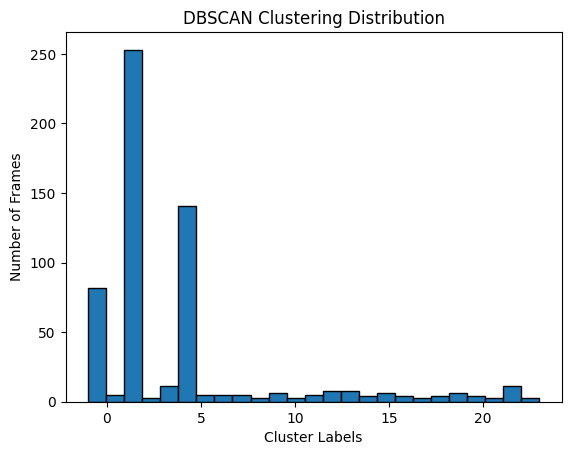

Number of detected scene clusters: 24


In [37]:
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Load the embeddings
embeddings = np.load("reduced_embeddings.npy")

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=10, min_samples=3, metric="euclidean")  # Decrease 'eps'
labels = dbscan.fit_predict(embeddings)
np.save("cluster_labels.npy", labels)


# Visualize clustering results
plt.hist(labels, bins=len(set(labels)), edgecolor="black")
plt.xlabel("Cluster Labels")
plt.ylabel("Number of Frames")
plt.title("DBSCAN Clustering Distribution")
plt.show()

# Get the number of unique clusters (excluding noise points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Number of detected scene clusters: {num_clusters}")


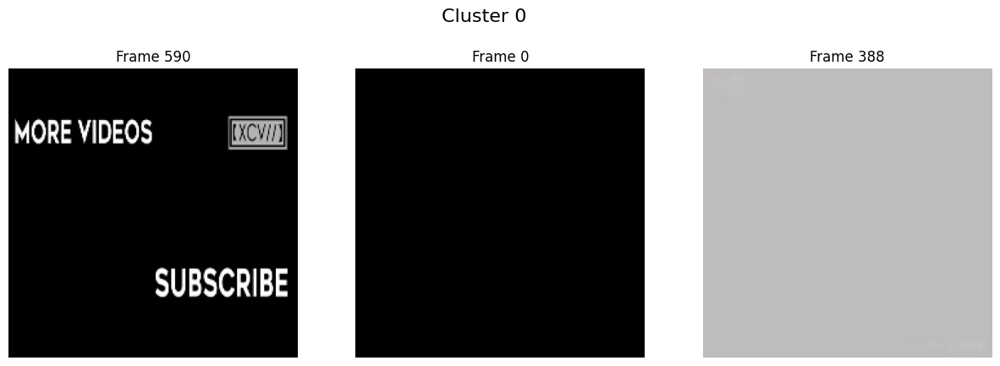

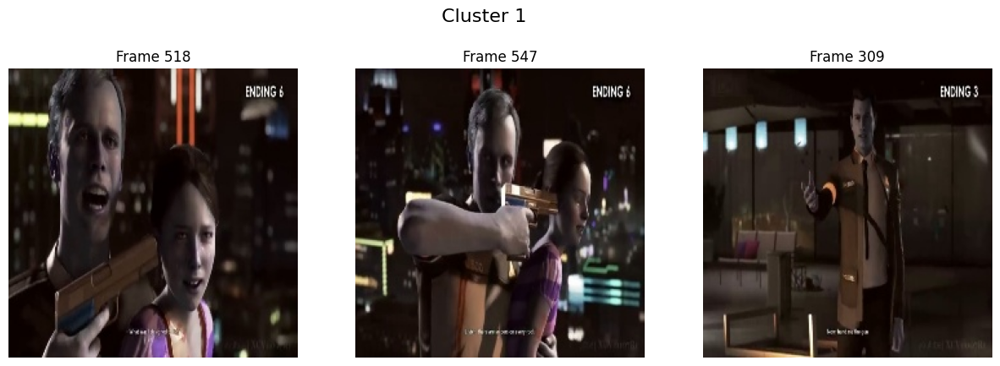

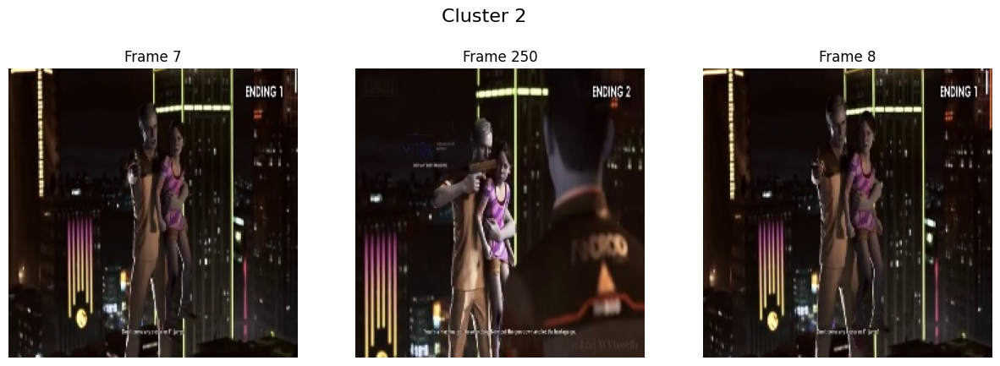

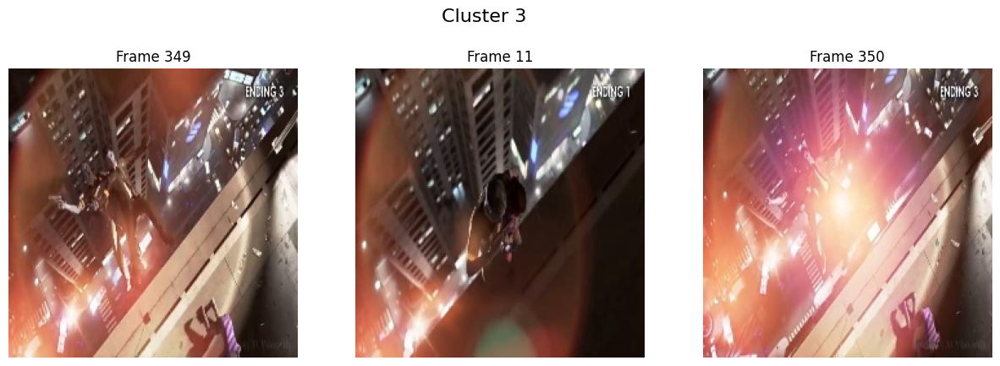

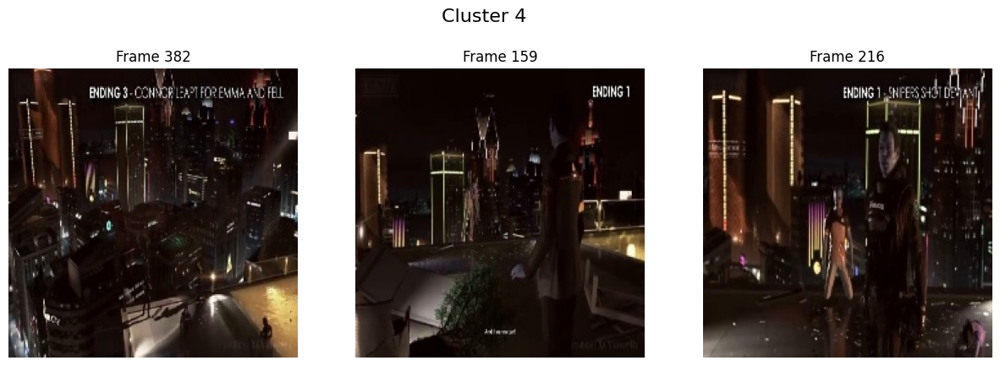

...

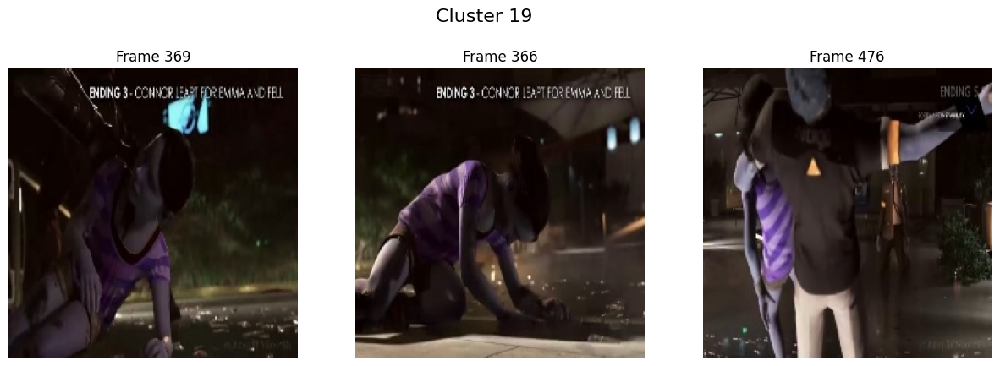

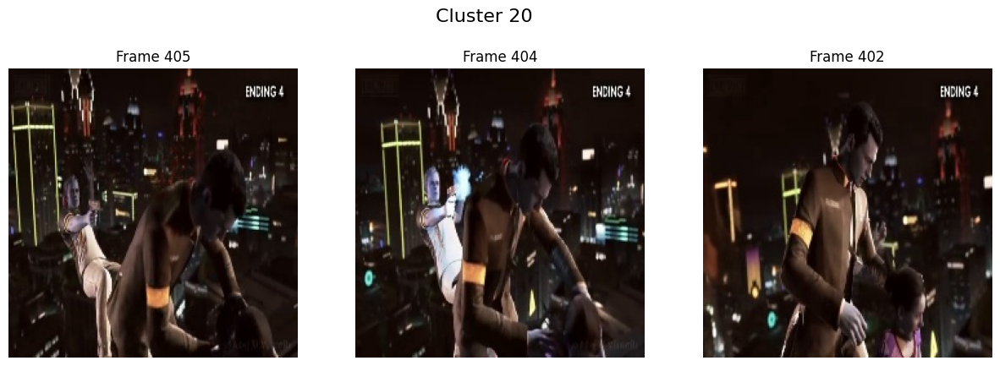

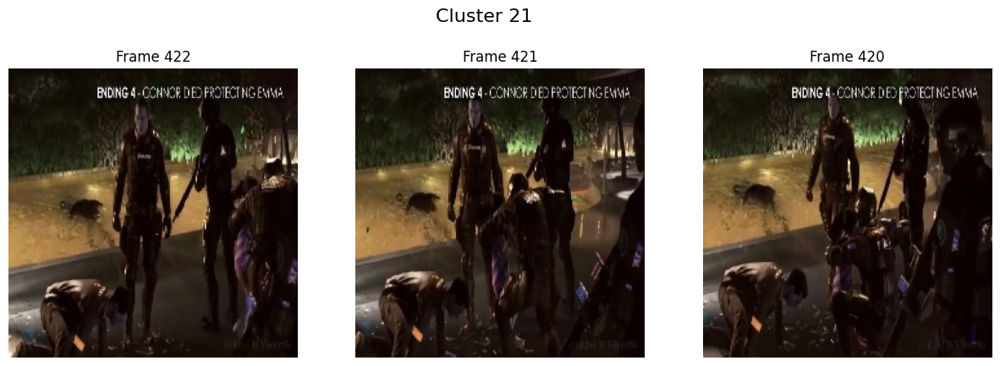

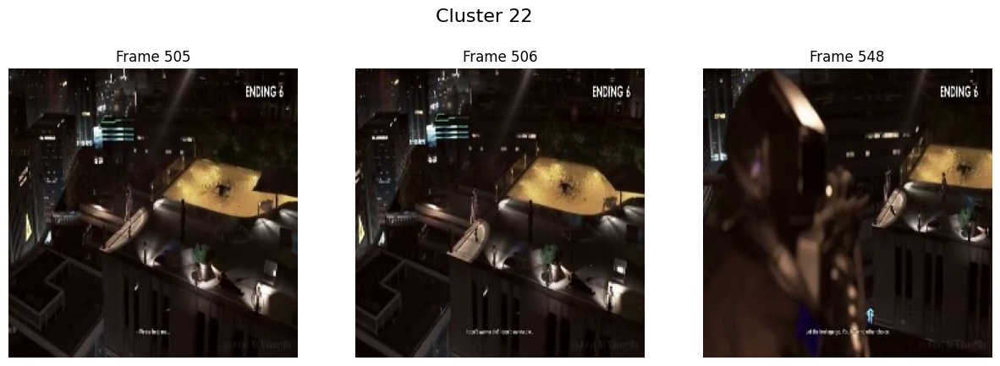

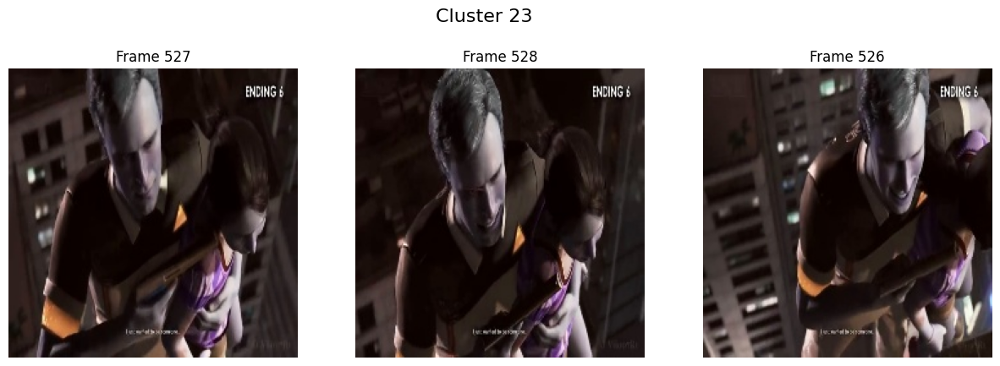

In [38]:
import matplotlib.pyplot as plt
import os
import numpy as np
import random
from PIL import Image

# Load cluster labels
labels = np.load("cluster_labels.npy")

# Path to preprocessed frames
preprocessed_frames_dir = "preprocessed_frames"
frame_filenames = sorted(os.listdir(preprocessed_frames_dir))

# Unique clusters (excluding noise if any)
unique_clusters = set(labels) - {-1}  # Remove -1 (noise points) if present

# Select random samples from each cluster
samples_per_cluster = 3  # Change this to adjust how many frames per cluster to display

for cluster in unique_clusters:
    cluster_indices = np.where(labels == cluster)[0]  # Get indices of frames in this cluster
    selected_indices = random.sample(list(cluster_indices), min(samples_per_cluster, len(cluster_indices)))

    fig, axes = plt.subplots(1, len(selected_indices), figsize=(15, 5))
    fig.suptitle(f"Cluster {cluster}", fontsize=16)

    for idx, frame_idx in enumerate(selected_indices):
        frame_path = os.path.join(preprocessed_frames_dir, frame_filenames[frame_idx])
        image = Image.open(frame_path)

        axes[idx].imshow(image)
        axes[idx].axis("off")
        axes[idx].set_title(f"Frame {frame_idx}")

    plt.show()


In [39]:
labels = np.load("cluster_labels.npy")

# Detect decision points based on cluster transitions
decision_points = [0]  # First frame is always a decision point
for i in range(1, len(labels)):
    if labels[i] != labels[i - 1]:  # Scene transition detected
        decision_points.append(i)

# Detect major visual differences
frame_differences = np.abs(np.diff(labels))
threshold = np.percentile(frame_differences, 90)  # Use a dynamic threshold
significant_changes = np.where(frame_differences > threshold)[0]

# Add unique decision points
decision_points.extend(significant_changes)
decision_points = sorted(set(decision_points))

np.save("decision_points.npy", decision_points)
print(f"Updated decision points: {len(decision_points)}")

Updated decision points: 220


In [40]:
import networkx as nx
import numpy as np
from collections import defaultdict

# Load data
labels = np.load("cluster_labels.npy")
decision_points = np.load("decision_points.npy")

# Create directed graph
G = nx.DiGraph()

# Add nodes for decision points
for frame in decision_points:
    G.add_node(str(frame), label=f"Scene {labels[frame]}")  # Convert frame index to string

# Group frames by their cluster labels
scene_to_frames = defaultdict(list)
for i, label in enumerate(labels):
    scene_to_frames[label].append(i)

# Ensure branching by linking each decision point to at least two different future nodes
for i in range(len(decision_points) - 1):
    current_node = str(decision_points[i])
    next_candidates = set()

    # Define a window to find possible next decision points
    max_search_distance = 50  # Adjust this based on scene duration

    for j in range(i + 1, len(decision_points)):
        if decision_points[j] - decision_points[i] > max_search_distance:
            break  # Stop if we exceed search distance

        if labels[decision_points[j]] != labels[decision_points[i]] and labels[decision_points[j]] != -1:
            next_candidates.add(str(decision_points[j]))
            if len(next_candidates) >= 2:  # Ensure at least 2 branches
                break

    # Add edges for branching
    for next_node in next_candidates:
        G.add_edge(current_node, next_node)

# Save graph
nx.write_gml(G, "scene_graph.gml")
print("Updated Graph saved as 'scene_graph.gml'")


Updated Graph saved as 'scene_graph.gml'


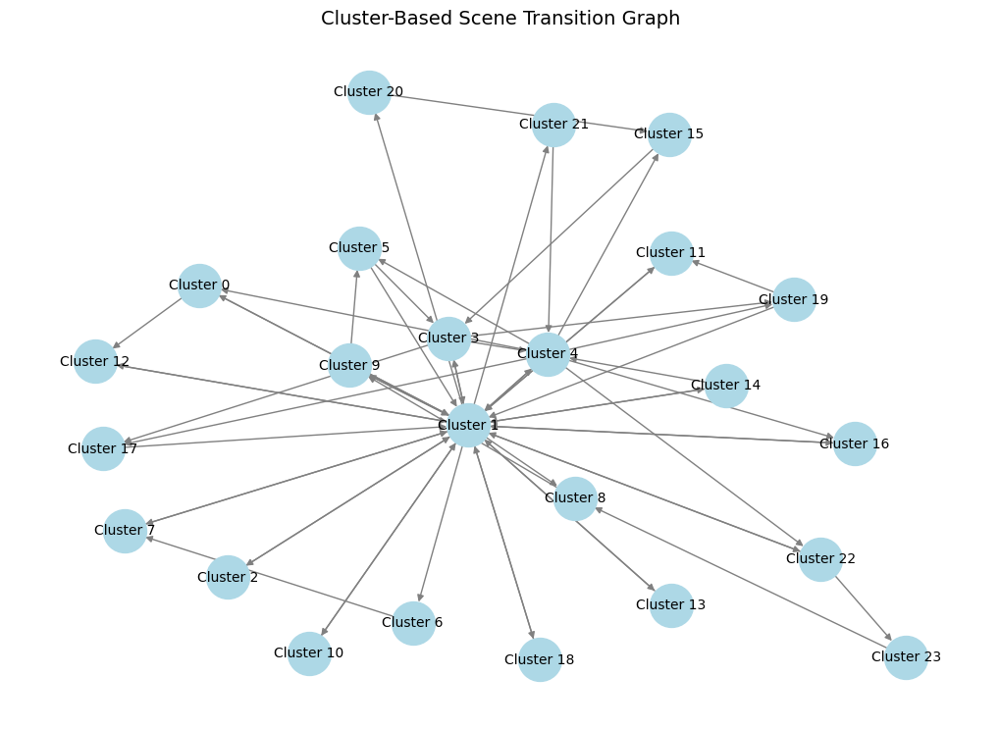

In [46]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Load cluster labels and decision points
labels = np.load("cluster_labels.npy")

# Create mapping of cluster to representative frame
cluster_to_frame = {}
for i, cluster in enumerate(labels):
    if cluster != -1 and cluster not in cluster_to_frame:  # Avoid noise and duplicate clusters
        cluster_to_frame[cluster] = i  # Pick the first frame as representative

# Create a directed graph
G = nx.DiGraph()

# Add nodes using representative frames
for cluster, frame in cluster_to_frame.items():
    G.add_node(f"Cluster {cluster}", label=f"Scene {cluster}")

# Add edges based on transitions
previous_cluster = None
for i in range(1, len(labels)):
    current_cluster = labels[i]
    
    if current_cluster != previous_cluster and current_cluster in cluster_to_frame:
        if previous_cluster in cluster_to_frame:  # Ensure valid cluster transition
            G.add_edge(f"Cluster {previous_cluster}", f"Cluster {current_cluster}")
        previous_cluster = current_cluster

# Visualize the improved graph
plt.figure(figsize=(10, 7))
pos = nx.spring_layout(G, k=0.5, seed=42)  # Spacing nodes better
nx.draw(
    G, pos, with_labels=True, node_size=1000,
    node_color="lightblue", edge_color="gray", font_size=10
)

plt.title("Cluster-Based Scene Transition Graph", fontsize=14)
plt.show()

